# Imports

In [1]:
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
import matplotlib.pyplot as plt
import matplotlib.cm as cm
plt.style.use('ggplot')

import seaborn as sns

params = {
    'text.color': (0.25, 0.25, 0.25),
    'figure.figsize': [18, 6],
   }

plt.rcParams.update(params)

import pandas as pd
pd.options.display.max_rows = 500
pd.options.display.max_seq_items = 500

import numpy as np
from numpy import percentile
np.random.seed(42)

import re
import copy
import math
import os
import sys
import json
from datetime import datetime
from collections import Counter
import time
import string
import glob
import calendar
from tqdm.notebook import tqdm

from scipy import stats
from scipy.stats import skew, kurtosis

from sklearn.neighbors import LocalOutlierFactor
from sklearn.ensemble import IsolationForest
from sklearn.preprocessing import MinMaxScaler

In [2]:
TITLE_SIZE = 24
TITLE_PADDING = 20

DEFAULT_CMAP = plt.rcParams['axes.prop_cycle'].by_key()['color']

# San Francisco Purchasing Commodity Data – Analysis of data from 2018 to 2022
---

## Import and clean data

In [3]:
columns = [
    'Fiscal Year',
    'Purchase Order Date',
    'Purchase Order',
    'Purchasing Department',
    'Purchasing Department Title',
    'Commodity Code',
    'Commodity Title',
    'Supplier & Other Non-Supplier Payees',
    'Post Date - Original',
    'Post Date - Current',
    'Encumbered Quantity',
    'Encumbered Amount'
    ]

In [4]:
df = pd.read_csv("_data/Purchasing_Commodity_Data.csv", usecols=columns, low_memory=False)

In [5]:
df.columns = df.columns.str.lower().str.replace(" ", "_").str.replace("-", "").str.replace("&", "").str.replace("__", "_")

cols = ['fiscal_year', 'order_date', 'order',
       'dept_code', 'dept_title', 'post_date_original',
       'post_date_current', 'commodity_code', 'commodity_title',
       'supplier_name', 'quantity', 'price']

df.columns = cols

df.fiscal_year = df.fiscal_year.astype("int16")
df.order_date = pd.to_datetime(df.order_date)
df.post_date_original = pd.to_datetime(df.post_date_original)
df.post_date_current = pd.to_datetime(df.post_date_current)
df.commodity_code = df.commodity_code.astype("str")

# fill missing order dates with post dates
to_fix = df[df.order_date.isna()].index
df.loc[to_fix, "order_date"] = df.loc[to_fix, "post_date_original"]

# drop remaining samples with missing order dates
missing_order_dates = len(df[df.order_date.isna()])
to_drop = df[df.order_date.isna()].index
df.drop(to_drop, inplace=True)

# fill in NaN for value `Unspecified` in commodity code
df.commodity_code.replace("Unspecified", np.nan, inplace=True)

# dropping orders where information about commodity is missing
df.dropna(subset=["commodity_code"], inplace=True)

# convert commodity codes from strings to int
df.commodity_code = df.commodity_code.apply(lambda x: int(x)).astype("int32")

# create feature price_per_unit
df["price_per_unit"] = df.price / df.quantity

# create subset starting 2007 until most recent purchase
df_full = df[df.fiscal_year >= 2007].copy()

# remove all data before fiscal year 2018 and after 2021
df = df[(df.fiscal_year > 2017) & (df.fiscal_year <= 2021)].copy()
df.reset_index(drop=True, inplace=True)
df.drop(["post_date_original", "post_date_current"], axis=1, inplace=True)

# remove samples with price of 0 or below and
# remove samples with quantity 0 or below  
to_drop = df[(df.price<=0) | (df.quantity<=0)].index
df.drop(to_drop, inplace=True)

df.reset_index(drop=True, inplace=True)

print(f"After the cleaning step we have a reduced data set of {df.shape[0]:,.0f} purchases with a total to a sum of {df.price.sum() / 1_000_000_000:,.1f} billion USD.")

After the cleaning step we have a reduced data set of 1,711,390 purchases with a total to a sum of 5.7 billion USD.


## Remove orders that do not relate to goods
- To further consolidate the data I try to **exclude orders that do not relate to goods.**
- **Commodity codes equal and higher than 90000 mainly seem to indicate services, fees, allowances, rentals and generic orders.**  
- It makes senses to separate these orders and analyze those orders only if the client is interested in these too.

In [6]:
total_services = 100 / df.price.sum() * df[(df.commodity_code > 90_000) & (df.commodity_code < 1090_000)].price.sum()
print(f"Commodity codes 90000 and higher account for {total_services:.1f}% of total sales volume.\n")

print("Examples of commodity titles with codes 90000 and higher:\n")
display(sorted(list(df[df.commodity_code > 90_000].commodity_title.unique()))[::25])

Commodity codes 90000 and higher account for 21.9% of total sales volume.

Examples of commodity titles with codes 90000 and higher:



['AIRCRAFT AND AIRPORT OPERATIONS SERVICES',
 'Agriculture Equipment and Commodities',
 'Applications Software (For Minicomputer Systems)',
 'Automotive Equipment and Supply Manufacturing Services',
 'Bookbinding Services Perfect (Paperback Book Type)',
 'C.I.P. Land Surveying Services',
 'Carpet Cleaning Dyeing Installation and Repair',
 'Commercial Fishing Services for Shellfish',
 'Concrete Engineering',
 'Contracted Services Research Subject',
 'Crane Maintenance and Repair Marine',
 'Domestic Hot Water',
 'EQUIPMENT MAINTENANCE REPAIR CONSTRUCTION AND RELATED SER',
 'Employee Comp Training Tuition',
 'F & OI Fences',
 'Fire and Police Equipment (Not Otherwise Classified)',
 'Framing Services Picture',
 'Gas Analysis Services',
 'HIGHER EDUCATION MISCELLANEOUS',
 'Highway Equipment (Tractors Loaders Graders Dozers etc.)',
 'Industrial Hygiene Testing Services',
 'Internet Database Subscriptions',
 'Landscaping (Including Design Fertilizing Planting etc.',
 'Locksmith Services',
 'M

In [7]:
df = df[df.commodity_code < 90000].copy()
df_full = df_full[df_full.commodity_code < 90000].copy()

## First insights about reduced data set

- **~1.59 million purchases**
- **~4.46 billion total sum of all purchases**
- ~660 MB memory consumption
- **No more missing values**

In [8]:
display(df.info(memory_usage="deep", verbose=True, show_counts=True))
print()
print(f"Sum of all purchases: {df.price.sum():,.0f} USD")

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1587462 entries, 0 to 1711389
Data columns (total 11 columns):
 #   Column           Non-Null Count    Dtype         
---  ------           --------------    -----         
 0   fiscal_year      1587462 non-null  int16         
 1   order_date       1587462 non-null  datetime64[ns]
 2   order            1587462 non-null  object        
 3   dept_code        1587462 non-null  object        
 4   dept_title       1587462 non-null  object        
 5   commodity_code   1587462 non-null  int32         
 6   commodity_title  1587462 non-null  object        
 7   supplier_name    1587462 non-null  object        
 8   quantity         1587462 non-null  float64       
 9   price            1587462 non-null  float64       
 10  price_per_unit   1587462 non-null  float64       
dtypes: datetime64[ns](1), float64(3), int16(1), int32(1), object(5)
memory usage: 660.5 MB


None


Sum of all purchases: 4,464,756,003 USD


In [9]:
# sanity check if data is complete from beginning to end of each fiscal year
display(df.groupby("fiscal_year").order_date.min())
print()
display(df.groupby("fiscal_year").order_date.max())

fiscal_year
2018   2017-07-04
2019   2018-07-01
2020   2019-07-01
2021   2020-07-03
Name: order_date, dtype: datetime64[ns]

fiscal_year
2018   2018-06-30
2019   2019-06-28
2020   2020-06-30
2021   2021-06-30
Name: order_date, dtype: datetime64[ns]

In [10]:
display(pd.concat([df.head(3), df.tail(3)]))

,fiscal_year,order_date,order,dept_code,dept_title,commodity_code,commodity_title,supplier_name,quantity,price,price_per_unit
0,2018,2017-10-04,0000000019,DPH,DPH Public Health,64030,Mailing Tubes and Storage Tubes,R R DONNELLEY,2.0,127.50,63.750000
1,2018,2018-03-20,0000000021,DPH,DPH Public Health,64030,Mailing Tubes and Storage Tubes,R R DONNELLEY,500.0,1990.00,3.980000
2,2018,2018-03-20,0000000021,DPH,DPH Public Health,64030,Mailing Tubes and Storage Tubes,R R DONNELLEY,260.0,4271.80,16.430000
1711387,2021,2021-03-18,000416336B,PUC,PUC Public Utilities Commsn,19000,CHEMICALS AND SOLVENTS COMMERCIAL (IN BULK),SOLENIS LLC,1641570.0,3401907.60,2.072350
1711388,2021,2021-06-11,000522764A,DPH,DPH Public Health,47040,Fracture Frames Traction Apparatus Trapeze Bar...,CME,6.0,2602.37,433.728333
1711389,2021,2020-10-30,410573,SHF,SHF Sheriff,7000,AUTOMOTIVE VEHICLES AND RELATED TRANSPORTATION...,Northern Californias Emergency Vehicle I,1.0,5067.20,5067.200000


## Duplicates

- Since I removed feature `order_line` we now have exact duplicates in our data. 
- This won't affect our analysis. The duplicates simply mean that the same good was ordered several times in one order.

In [11]:
print(f"There are {df.duplicated().sum():,.0f} exact duplicates in the data set.")

There are 43,064 exact duplicates in the data set.


## Examining the reduced data set

### Value counts of features
- We have **orders from 52 departements**.
- The **Department of Public Health issued by far the most orders** (~1.33 million). Most ordered goods were bandages and syringes.
- According to commodity codes **3'823 unique goods were ordered** (with 3'745 unique commodity titles).
- Orders were commissioned to **2'525 suppliers**.

In [12]:
# cols = ["order"]

# for feature in df.drop(cols, axis=1):
#     print("-"*80)
#     print(feature, "|", df[feature].dtype, "| unique:", df[feature].nunique())
#     print(df[feature].value_counts(dropna=False).sort_values(ascending=False))
#     print()

### Order count and purchase volume
- The **top spenders by purchase volume are departments of Public Utilities, Public Health, the MTA and the Police.** 
- The **distribution of order *counts* is very skewed**, mainly due to the **extreme order count by the Department of Public Health.**

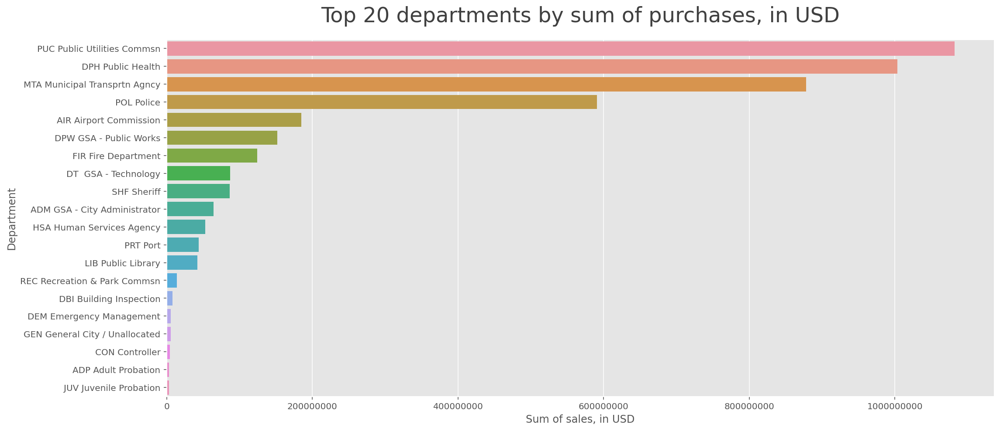

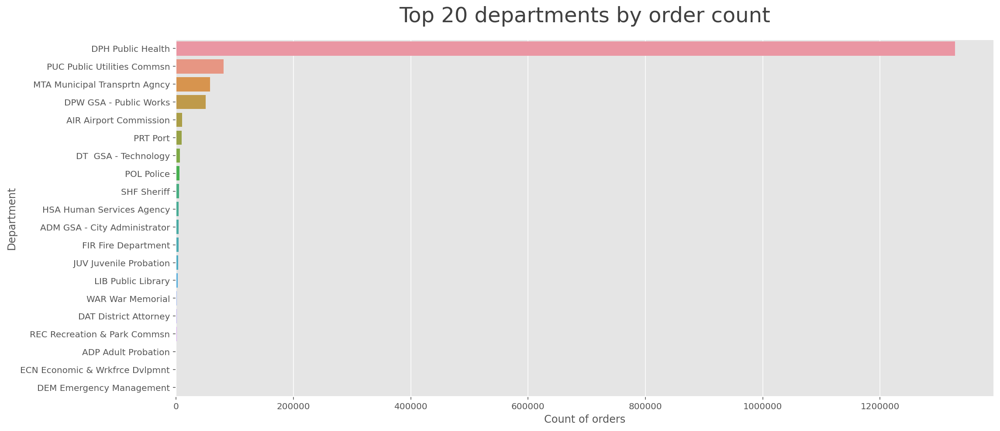

In [13]:
top_n = 20

tmp = df.groupby("dept_title").price.sum().sort_values(ascending=False)[:top_n]
tmp = pd.DataFrame(tmp).reset_index()
plt.figure(figsize=(16,7))
sns.barplot(data=tmp, y="dept_title", x="price")
plt.title(f"Top {top_n} departments by sum of purchases, in USD", size=TITLE_SIZE, pad=TITLE_PADDING)
plt.ylabel("Department")
plt.xlabel("Sum of sales, in USD")
plt.ticklabel_format(axis="x", style="plain")
plt.tight_layout()
plt.show()


tmp = df.groupby("dept_title").order.count().sort_values(ascending=False)[:top_n]
tmp = pd.DataFrame(tmp).reset_index()
plt.figure(figsize=(16,7))
sns.barplot(data=tmp, y="dept_title", x="order")
plt.title(f"Top {top_n} departments by order count", size=TITLE_SIZE, pad=TITLE_PADDING)
plt.ylabel("Department")
plt.xlabel("Count of orders")
plt.ticklabel_format(axis="x", style="plain")
plt.tight_layout()
plt.show()

- The Dept. of Public Health sticks out in 2020 – very likely due to increased demand during the first wave of the Corona epidemic.

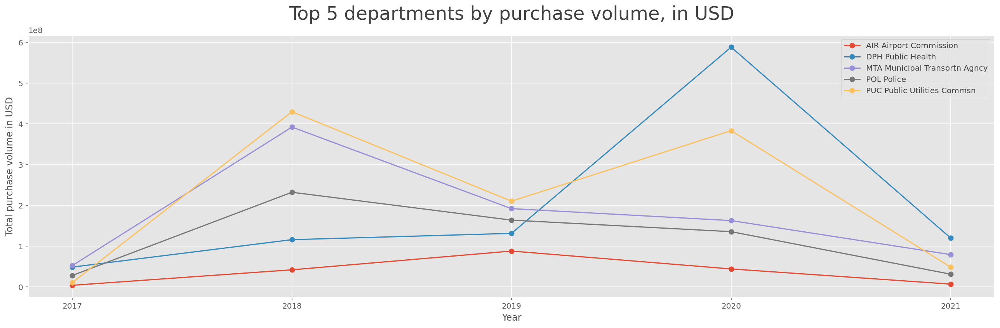

In [14]:
top_n = 5

top_depts = df.groupby("dept_title").price.sum().sort_values(ascending=False)[:top_n].index
df_depts = df[df.dept_title.isin(top_depts)].copy()

g = df_depts.groupby("dept_title")
fig, ax = plt.subplots()
for name, data in g:
    data.groupby(data.order_date.dt.year).price.sum().plot(marker="o", label=name, ax=ax)
    plt.legend()

plt.title(f"Top {top_n} departments by purchase volume, in USD", size=TITLE_SIZE, pad=TITLE_PADDING)
plt.xticks(ax.get_xticks()[1::2])
plt.xlabel("Year")
plt.ylabel("Total purchase volume in USD")
plt.tight_layout()
plt.show()

- **Orders by only the top 4 spending departments account for ~79% of purchase volume.**
- **The top 10 spending departments account for more than 95% of purchase volume.** The top 20 make over 99% of sales volume. 
- It makes sense to **only look at these 10-20 top spending departments to assess saving potentials.**

In [15]:
for top_n in [4, 10, 15, 20]:
    tmp = df.groupby("dept_title").price.sum().sort_values(ascending=False).cumsum()
    total_sales = df.price.sum()
    tmp = pd.DataFrame(tmp)
    tmp["cum_perc"] = 100 / total_sales * tmp.price
    print(f"The top {top_n:02.0f} purchasing departments account for {tmp.iloc[:top_n].cum_perc.max():.1f}% of purchase volume.")
print()

The top 04 purchasing departments account for 79.6% of purchase volume.
The top 10 purchasing departments account for 95.3% of purchase volume.
The top 15 purchasing departments account for 98.9% of purchase volume.
The top 20 purchasing departments account for 99.4% of purchase volume.



- **The total volume of purchases is ~4.46 billion USD** (all 4 fiscal years).
- **On average ~1.11 billion USD was spent on goods per year** (services excluded). 
- There is **a noticably higher purchase volume in 2020.** This is very likely due to additional demand during the Corona crisis.

4,464,756,003 USD total volume of purchases in data set.
1,035,990,463 USD median purchase volume per year (1,116,189,001 mean).



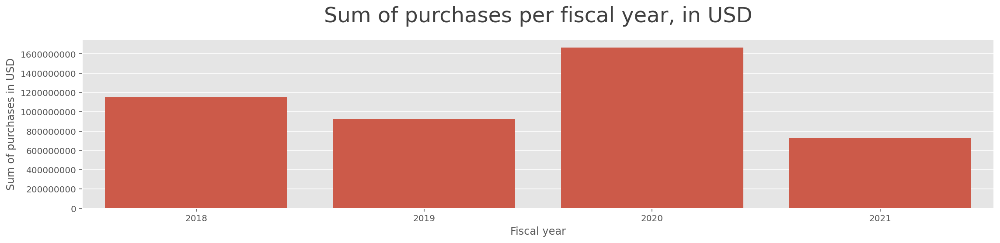

In [16]:
sum_of_sales = df.price.sum()
print(f"{sum_of_sales:,.0f} USD total volume of purchases in data set.")

mean_sales_per_year = df.groupby("fiscal_year").price.sum().mean()
median_sales_per_year = df.groupby("fiscal_year").price.sum().median()
print(f"{median_sales_per_year:,.0f} USD median purchase volume per year ({mean_sales_per_year:,.0f} mean).\n")

tmp = df.groupby("fiscal_year").price.sum()
tmp = pd.DataFrame(tmp)
tmp.index.name = "year"
tmp.columns = ["count"]
tmp.reset_index(inplace=True)
plt.figure(figsize=(16,4))
sns.barplot(data=tmp, x="year", y="count", color=DEFAULT_CMAP[0])
plt.ticklabel_format(axis="y", style="plain")
plt.title("Sum of purchases per fiscal year, in USD", size=TITLE_SIZE, pad=TITLE_PADDING)
plt.ylabel("Sum of purchases in USD")
plt.xlabel("Fiscal year")
plt.tight_layout()
plt.savefig("plot_purchase_sum.png", dpi=200, transparent=True)
plt.show()

- **On average ~397k orders were issued per year** (services excluded). 

397,820 median order count per year (396,866 mean).



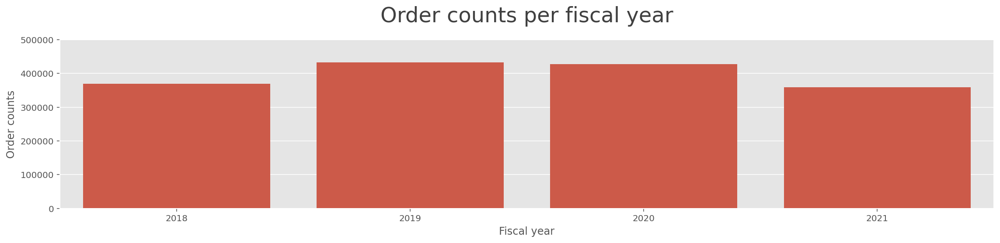

In [17]:
mean_order_per_year = df.groupby("fiscal_year").fiscal_year.count().mean()
median_order_per_year = df.groupby("fiscal_year").fiscal_year.count().median()
print(f"{median_order_per_year:,.0f} median order count per year ({mean_order_per_year:,.0f} mean).\n")

tmp = df.groupby("fiscal_year").fiscal_year.count()
tmp = pd.DataFrame(tmp)
tmp.index.name = "year"
tmp.columns = ["count"]
tmp.reset_index(inplace=True)
plt.figure(figsize=(16,4))
sns.barplot(data=tmp, x="year", y="count", color=DEFAULT_CMAP[0])
plt.ylim(0, 500_000)
plt.title("Order counts per fiscal year", size=TITLE_SIZE, pad=TITLE_PADDING)
plt.ylabel("Order counts")
plt.xlabel("Fiscal year")
plt.tight_layout()
plt.show()

### Dates

We see that **time related purchase patterns are also present from 2017 onward:** 
- Interestingly – the *end of fiscal-year-gaps* are only noticable in June 2017, 2020 and 2021. 
- There is no gap 2018. 
- 2019 the gap happens **before** end of June. 

Reasons behind that need to be discussed with the client.

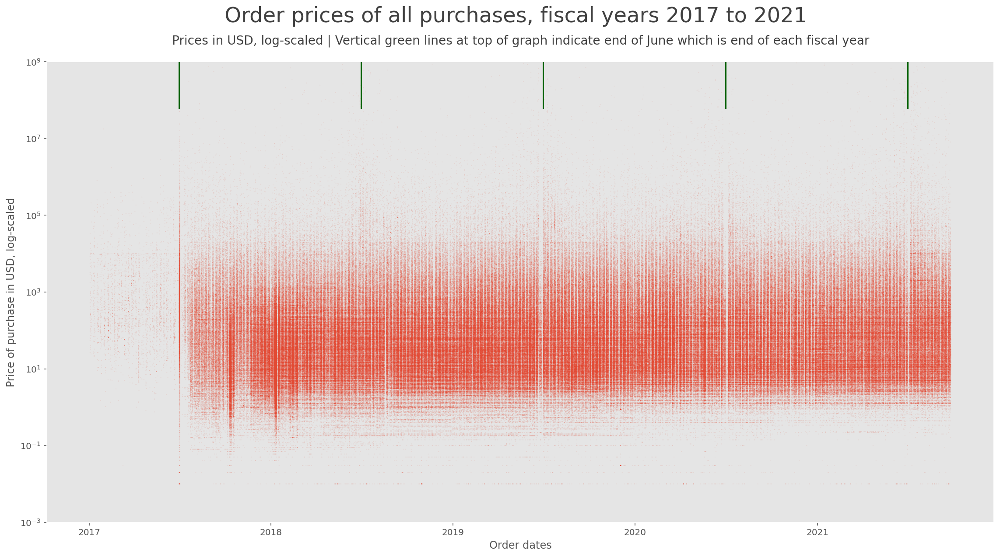

In [18]:
start_year = 2017
plt.figure(figsize=(16, 9))
ax = sns.scatterplot(data=df_full[df_full.order_date.dt.year >= start_year], x="order_date", y="price", 
                alpha=.1, 
                s=1, 
                edgecolor='none'
               )

plt.yscale("log")
plt.ylim(0.001, 1_000_000_000)

for year in range(start_year, 2022):
    plt.axvline(pd.to_datetime(f"{year}-06-30"), 0.9, color="darkgreen")

plt.suptitle(f"     Order prices of all purchases, fiscal years {start_year} to 2021", size=24)
plt.title("Prices in USD, log-scaled | Vertical green lines at top of graph indicate end of June which is end of each fiscal year", size=14, pad=20)
plt.xlabel("Order dates")
plt.ylabel("Price of purchase in USD, log-scaled")
    
plt.grid(visible=None)
plt.tight_layout()
plt.show()

More observations from the time related plots:

- **Most money is spent in the first half of the year** (which is the 2nd half of the *fiscal* year).
- **More money is spent in the third week of January, in March and in June.**
- **The high spending in June might be, because departments want to use their remaining budget before the end of the fiscal year** (end of June).
- **Most money is spent on Fridays.** Possibly employees want to close tasks before leaving for the weekend.

**These time related patterns can be problematic** and **detrimental to the efficient use of the City's budget. A vendor might exploit these patterns by asking higher prices than usual because he/she knows that the City is under pressure to close an order.**

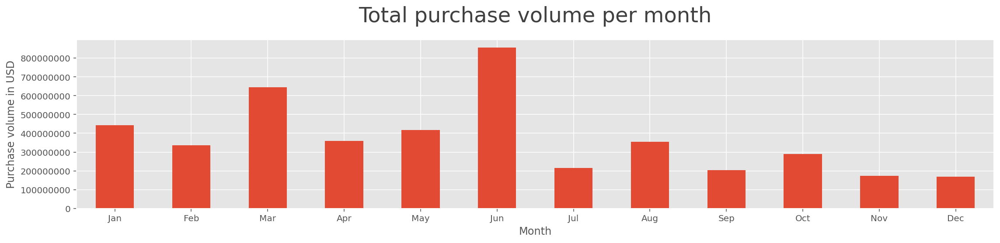

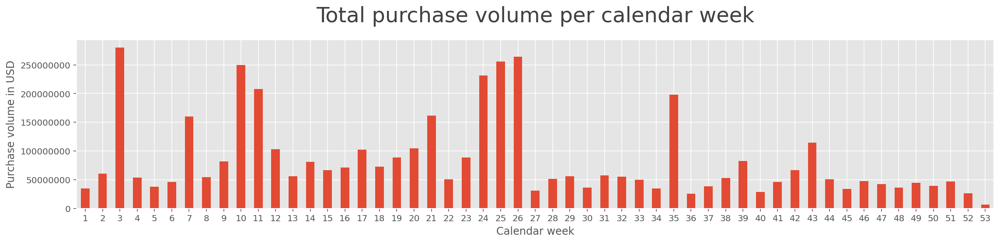

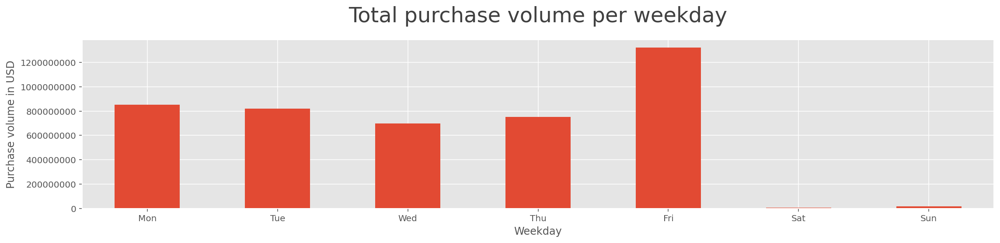

In [19]:
figsize = (16,5)

plt.figure(figsize=(16,4))
df.groupby(df.order_date.dt.month).price.sum().plot.bar()
plt.title(f"Total purchase volume per month", size=TITLE_SIZE, pad=TITLE_PADDING)
plt.xticks(ticks=range(0, 12), labels=list(calendar.month_abbr[1:]), rotation=0)
plt.ticklabel_format(axis="y", style="plain")
plt.ylabel("Purchase volume in USD")
plt.xlabel("Month")
plt.tight_layout()
plt.show()

plt.figure(figsize=(16,4))
df.groupby(df.order_date.dt.isocalendar().week).price.sum().plot.bar()
plt.title(f"Total purchase volume per calendar week", size=TITLE_SIZE, pad=TITLE_PADDING)
plt.ticklabel_format(axis="y", style="plain")
plt.xticks(rotation=0)
plt.ylabel("Purchase volume in USD")
plt.xlabel("Calendar week")
plt.savefig("plot_purchases_weeks.png", dpi=200, transparent=True)
plt.tight_layout()

plt.show()

plt.figure(figsize=(16,4))
df.groupby(df.order_date.dt.weekday).price.sum().plot.bar()
plt.title(f"Total purchase volume per weekday", size=TITLE_SIZE, pad=TITLE_PADDING)
plt.ticklabel_format(axis="y", style="plain")
plt.xticks(ticks=range(0, 7), labels=list(calendar.day_abbr), rotation=0)
plt.ylabel("Purchase volume in USD")
plt.xlabel("Weekday")
plt.tight_layout()
plt.savefig("plot_purchases_weekday.png", dpi=200, transparent=True)
plt.show()

### Goods
- The **most important purchased goods by sales volume are chemicals, first aid and safety equipment, automobiles and computer hardware**.

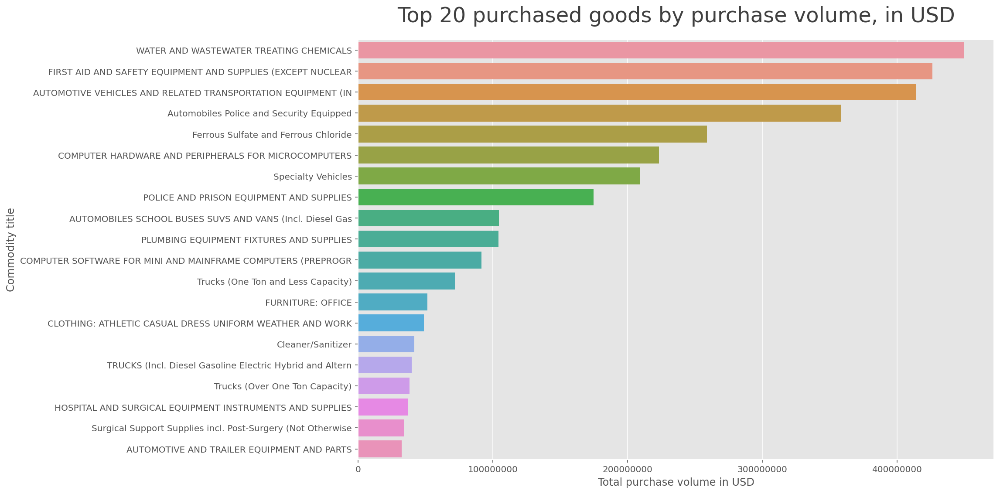

In [20]:
top_n = 20

tmp = df.groupby("commodity_title").price.sum().sort_values(ascending=False)
tmp = pd.DataFrame(tmp).reset_index()

plt.figure(figsize=(16,8))
sns.barplot(data=tmp.iloc[:top_n], y="commodity_title", x="price")
plt.title(f"Top 20 purchased goods by purchase volume, in USD", size=TITLE_SIZE, pad=TITLE_PADDING)
plt.ticklabel_format(axis="x", style="plain")
plt.ylabel("Commodity title")
plt.xlabel("Total purchase volume in USD")
plt.tight_layout()
plt.show()

- **The top 250 ordered goods account for ~95% of the total purchase volume.** 
- It makes sense to **concentrate on these goods for further analysis, because the saving potential is so much higher** than for other goods.

In [21]:
tmp["cumsum_price"] = tmp.price.cumsum()
tmp["cumsum_perc"] = 100 / df.price.sum() * tmp.cumsum_price
for top_n in [10, 25, 50, 100, 250]:
    share_of_sales = tmp.iloc[:top_n].cumsum_perc.max()
    print(f"The top {top_n:03.0f} ordered goods by purchase volume account for: {share_of_sales:.0f}% of total purchase volume.")
print()

The top 010 ordered goods by purchase volume account for: 61% of total purchase volume.
The top 025 ordered goods by purchase volume account for: 75% of total purchase volume.
The top 050 ordered goods by purchase volume account for: 82% of total purchase volume.
The top 100 ordered goods by purchase volume account for: 89% of total purchase volume.
The top 250 ordered goods by purchase volume account for: 95% of total purchase volume.



### Suppliers
- The most important suppliers by sales volume are [Kemira](https://www.kemira.com/water/) and [Univars](https://discover.univarsolutions.com/) (chemicals), [Bob Wondries](https://www.bobwondriesford.com/) and [Towne Ford](https://www.towneford.com/) (car dealers), [Fam LLC](https://www.fambrands.com/services) (mixed fashion brand retailer), [Medline](https://www.medline.eu/) (medical products) and [Galls](https://www.galls.com/brands/quartermaster) (police equipment). 
- Orders to these 7 suppliers alone account for more than 40% of the sales budget (services excluded).

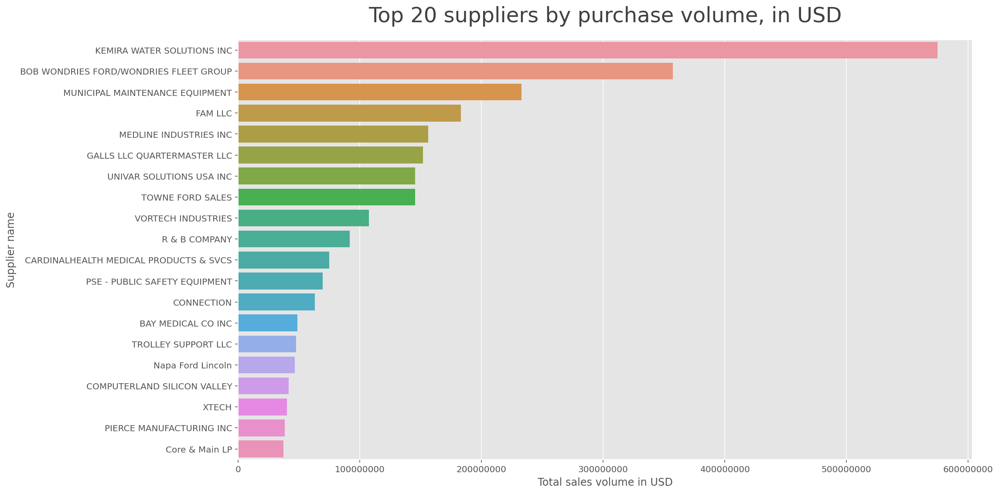

In [22]:
top_n = 20

tmp = df.groupby("supplier_name").price.sum().sort_values(ascending=False)
tmp = pd.DataFrame(tmp).reset_index()

plt.figure(figsize=(16,8))
sns.barplot(data=tmp.iloc[:top_n], y="supplier_name", x="price")
plt.title(f"Top 20 suppliers by purchase volume, in USD", size=TITLE_SIZE, pad=TITLE_PADDING)
plt.ticklabel_format(axis="x", style="plain")
plt.ylabel("Supplier name")
plt.xlabel("Total sales volume in USD")
plt.tight_layout()
plt.show()

- **The top 350 suppliers account for ~95% of the total purchase volume.** 
- It makes sense to **concentrate on these suppliers for further analysis**.

In [23]:
tmp["cumsum_price"] = tmp.price.cumsum()
tmp["cumsum_perc"] = 100 / df.price.sum() * tmp.cumsum_price
for top_n in [5, 10, 20, 100, 200, 350]:
    share_of_sales = tmp.iloc[:top_n].cumsum_perc.max()
    print(f"The top {top_n:03.0f} suppliers by purchase volume account for: {share_of_sales:.0f}% of total sales volume.")
print()

The top 005 suppliers by purchase volume account for: 34% of total sales volume.
The top 010 suppliers by purchase volume account for: 48% of total sales volume.
The top 020 suppliers by purchase volume account for: 59% of total sales volume.
The top 100 suppliers by purchase volume account for: 85% of total sales volume.
The top 200 suppliers by purchase volume account for: 92% of total sales volume.
The top 350 suppliers by purchase volume account for: 95% of total sales volume.



### Prices
- **The distribution of prices is extremely skewed.** 
- The median is 44 USD, the mean is ~2.8k.
- The standard variation (sensitive to outliers like the mean) is ~360k USD.
- Prices range from close to 0 to a whopping 220'676'497 (again – the order of chemicals for the Dept. of Public Utilities).
- Most orders are in the range of 0 to ~500.

In [24]:
display(df.price.describe().astype(int))

count      1587462
mean          2812
std         359326
min              0
25%             10
50%             44
75%            230
max      220676497
Name: price, dtype: int64

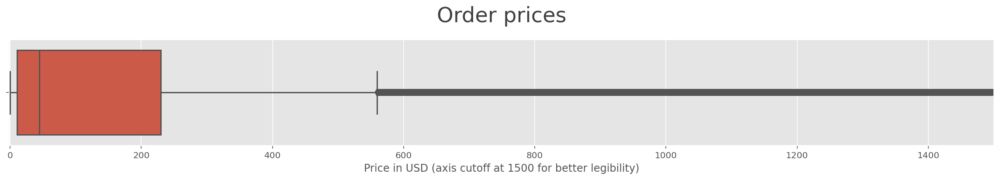

In [25]:
plt.figure(figsize=(16,3))
sns.boxplot(data=df, x="price")
plt.title(f"Order prices", size=TITLE_SIZE, pad=TITLE_PADDING)
plt.xlim(-1, 1500)
plt.xlabel("Price in USD (axis cutoff at 1500 for better legibility)")
plt.tight_layout()
plt.show()

### Price analysis with respect to quantities and time
- Commodity codes are simply labels for the commodity titles. Both features contain the same information.
- Looking at the titles in more detail I see that these are **broad categories**, sometimes **very generic ones**, e.g., «ALL CATEGORIES» (code `1`). **Purchases with the same code or title can contain very different goods.**
- **Analysis of price trends with regard to amount or time will therefore be not meaningful.**

In [26]:
goods = df.commodity_code.astype(str) + " " + df.commodity_title
display(sorted(set(goods))[::100])
print()

['1 ALL CATEGORIES',
 '13505 Alabaster Gypsum etc.',
 '15549 Medical Structures Prefabricated',
 '19042 Compounds Inorganic Chemical',
 '20167 Robes Caps and Gowns (Choir and Graduation Types)',
 '20730 Compact Disks DVD ROM etc.',
 '22075 Transducers and Couplers',
 '26069 Resins (For Repair and Restoration): Acrylic Epoxy etc.',
 '28560 Locators Cable',
 '3106 Air Conditioning and Heating: Central Units and Parts and A',
 '32083 Threaded Rods Studs and Fittings',
 '35000 FLAGS FLAG POLES BANNERS AND ACCESSORIES',
 '38554 Juices',
 '41009 Cabinets Narcotics',
 '43516 Detergent Surgical Scrub All Types',
 '45010 Bins Cabinets and Shelves Other than Metal or Wood (Not O',
 '46040 Hot Water Hose',
 '47533 Dermatome Blades Cement and Tape',
 '48575 Receptacle Liners: Vinyl and Steel (See 665-24 For Plastic T',
 '50000 LAUNDRY AND DRY CLEANING EQUIPMENT ACCESSORIES  AND SUPPLI',
 '5256 Paintings (Originals) (Oil Acrylic Water Color etc.)',
 '55004 Beads Glass Sign and Stripe',
 '5578 Seats

**Plotting the top 20 commodities by purchase count confirms that the data contains very different goods under broad categories:** 
- To make patterns in the data more visible I log-scale the y-axis (prices). 
- There are distinct horizontal lines noticable which could be distinct product items. It is possible too that these lines simply refer to popular price tags like 100 USD, 9.99 etc. 
- **I don't see any feasible way to separate distinct goods from the categories.**
- Nonetheless many outliers and anomalous purchases are observable. 

Bandages (All Types) Adhesive Tapes Dressings Plaster of


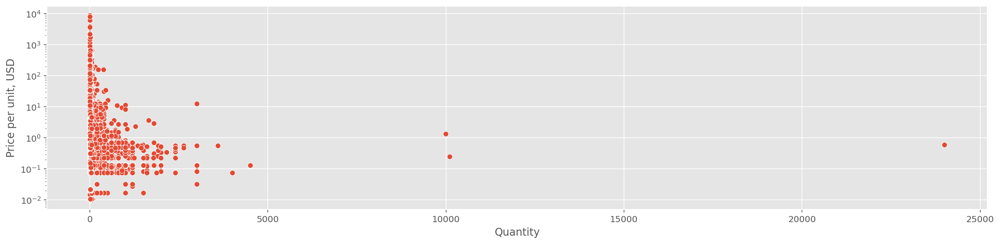

Electrolytic Caloric and Water Balance


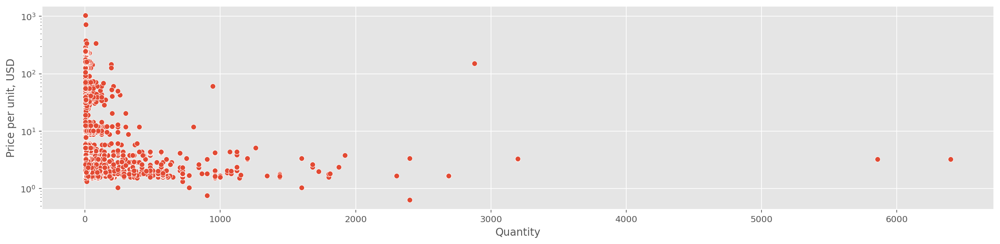

Surgical Support Supplies incl. Post-Surgery (Not Otherwise


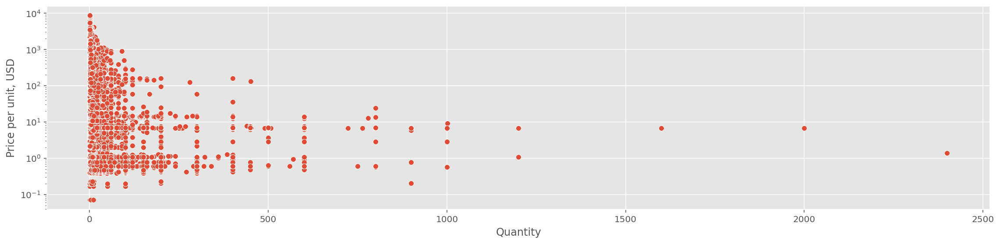

Sutures and Suturing Needles Disposable (Including Skin Sta


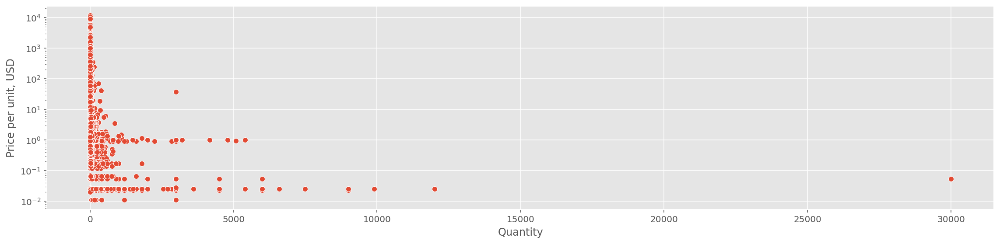

Syringes Hypodermic and Irrigation (Disposable) and Hypode


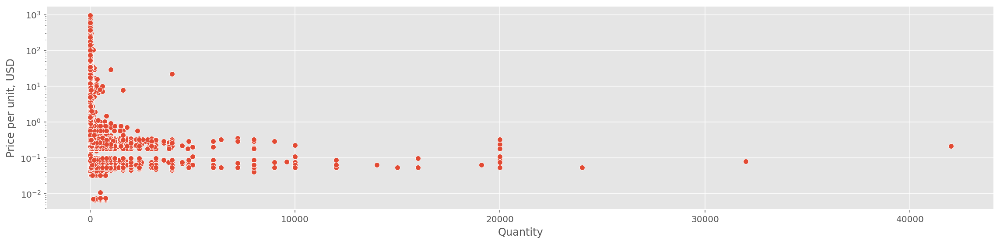

In [27]:
# Just using Top 5 for notebooks on GitHub
top_n = 5
tmp = df.groupby("commodity_title").fiscal_year.count().sort_values(ascending=False)[:top_n]
top_goods = df[df.commodity_title.isin(tmp.index)]
g = top_goods.groupby("commodity_title")

for name, data in g:
    print(name)
    plt.figure(figsize=(16,4))
    sns.scatterplot(data=data, x="quantity", y="price_per_unit")
    plt.yscale("log")
    plt.xlabel("Quantity")
    plt.ylabel("Price per unit, USD")
    plt.tight_layout()
    plt.show()

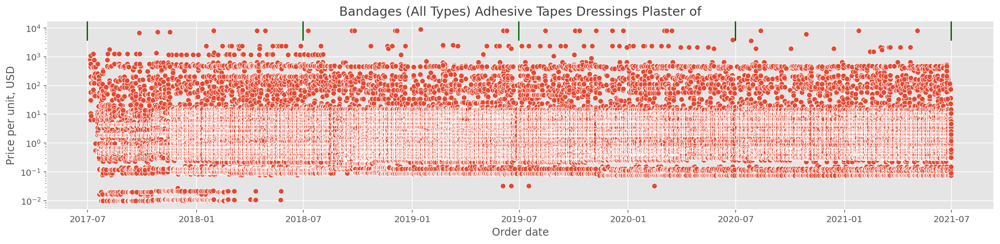

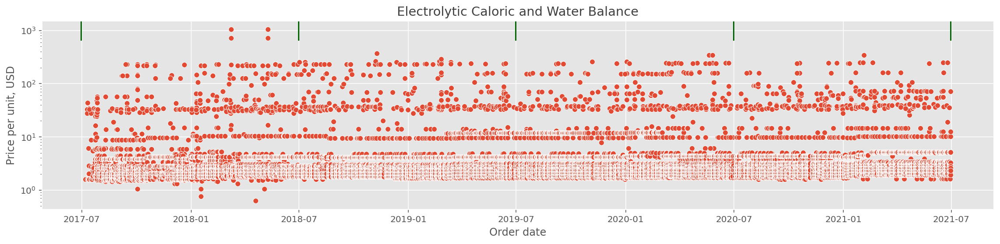

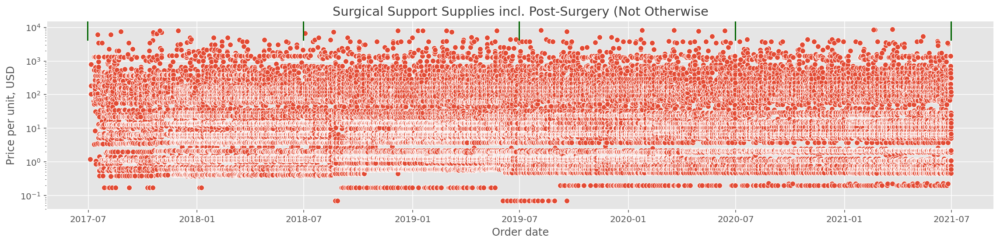

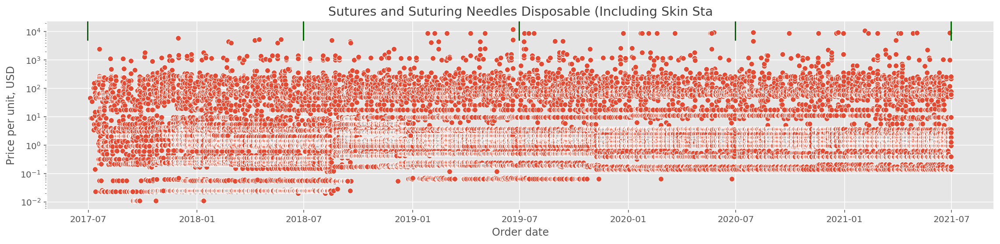

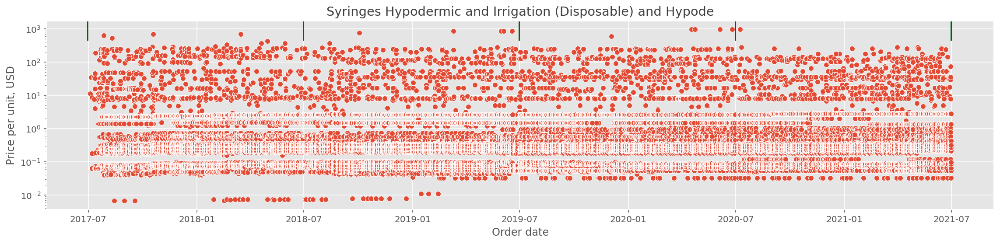

In [28]:
for name, data in g:
    plt.figure(figsize=(16,4))
    sns.scatterplot(data=data, x="order_date", y="price_per_unit")
    for year in range(2017, 2022):
        plt.axvline(pd.to_datetime(f"{year}-06-30"), 0.9, color="darkgreen")
    plt.title(f"{name}")
    plt.yscale("log")
    plt.xlabel("Order date")
    plt.ylabel("Price per unit, USD")
    plt.tight_layout()
    plt.show()

Index(['KEMIRA WATER SOLUTIONS INC', 'BOB WONDRIES FORD/WONDRIES FLEET GROUP',
       'MUNICIPAL MAINTENANCE EQUIPMENT', 'FAM LLC', 'MEDLINE INDUSTRIES INC'],
      dtype='object', name='supplier_name')


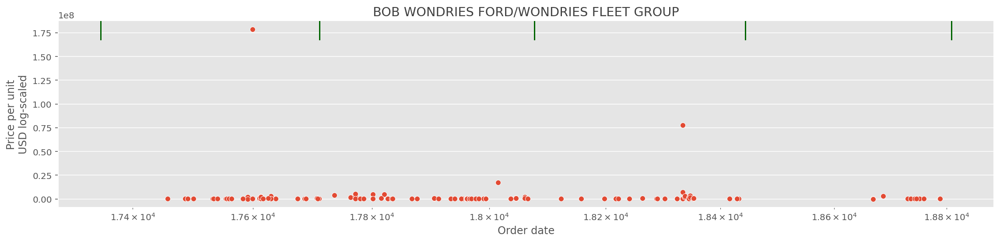

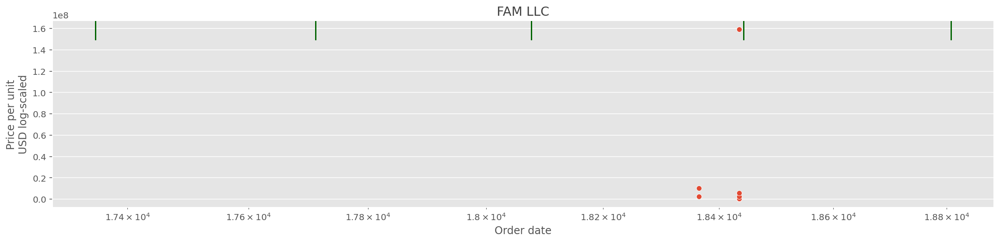

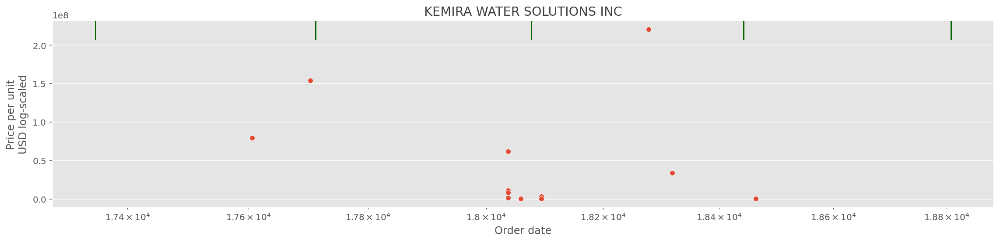

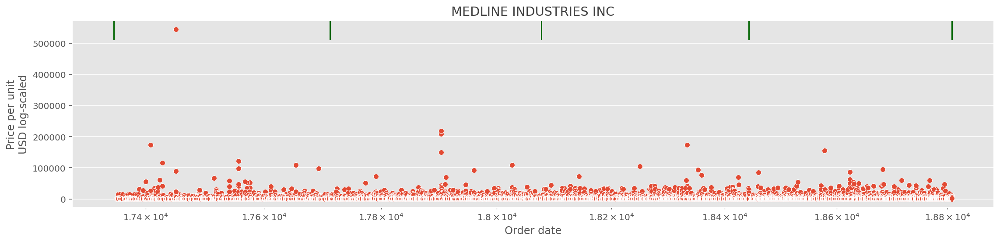

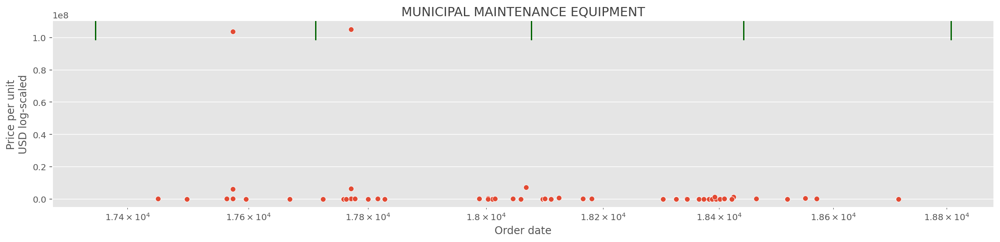

In [29]:
top_suppliers = df.groupby("supplier_name").price.sum().sort_values(ascending=False)[:top_n].index
print(top_suppliers)
df_suppliers = df[df.supplier_name.isin(top_suppliers)].copy()
g = df_suppliers.groupby("supplier_name")

for name, data in g:
    plt.figure(figsize=(16,4))
    sns.scatterplot(data=data, x="order_date", y="price")
    for year in range(2017, 2022):
        plt.axvline(pd.to_datetime(f"{year}-06-30"), 0.9, color="darkgreen")
    plt.xscale("log")
    plt.title(f"{name}")
    plt.xlabel("Order date")
    plt.ylabel("Price per unit\nUSD log-scaled")
    plt.tight_layout()
    plt.show()

### Outlier detection
We can analyse outliers either broadly with Isolationforest or locally with LocalOutlierFactor. The results look promising and would justify a deeper analysis.

In [30]:
tmp = df[df.commodity_title.str.startswith("Computer Software for mini and mainframe".upper())]
cols = ["quantity", "price_per_unit"]

# clf = LocalOutlierFactor()
# preds = clf.fit_predict(tmp[cols].values)

clf = IsolationForest(n_jobs=-1, n_estimators=500)
clf.fit(tmp[cols].values)
preds = clf.predict(tmp[cols].values)

colors = np.where(preds!=1, "#7F0000", "darkgrey")

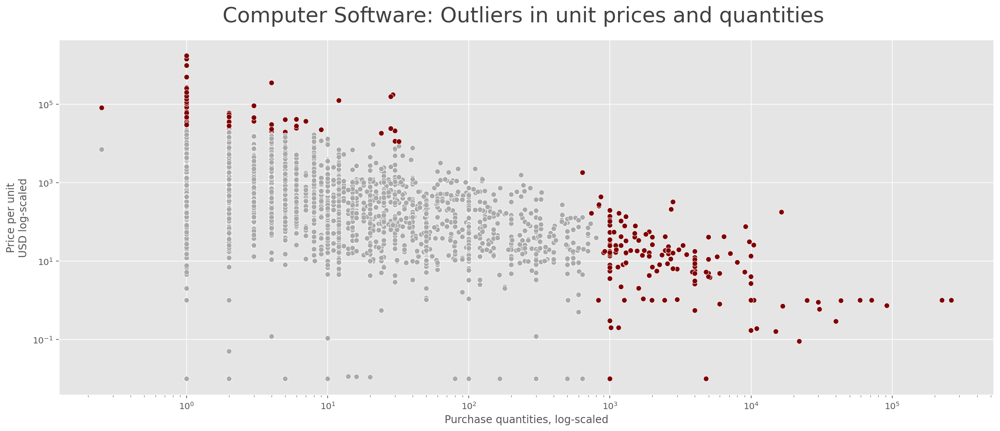

In [31]:
plt.figure(figsize=(16,7))
sns.scatterplot(data=tmp, x="quantity", y="price_per_unit", c=colors)
plt.title(f"Computer Software: Outliers in unit prices and quantities ", size=TITLE_SIZE, pad=TITLE_PADDING)
plt.xscale("log")
plt.yscale("log")
plt.xlabel("Purchase quantities, log-scaled")
plt.ylabel("Price per unit\nUSD log-scaled")
plt.tight_layout()
plt.show()

### Budget burn down
How do the top purchasing departments distribute their budget over the fiscal year?
- From plotting the budget «burn down» we can see that budgets are spent very differently timewise over the fiscal year.
- E.g. the Dept. of Public Health seems to spend more continuously (linear progression of line) while the Police dept. spends in large chunks (huge steps in spending line).

It makes sense to investigate here further in order to see if purchases can be negotiated better.

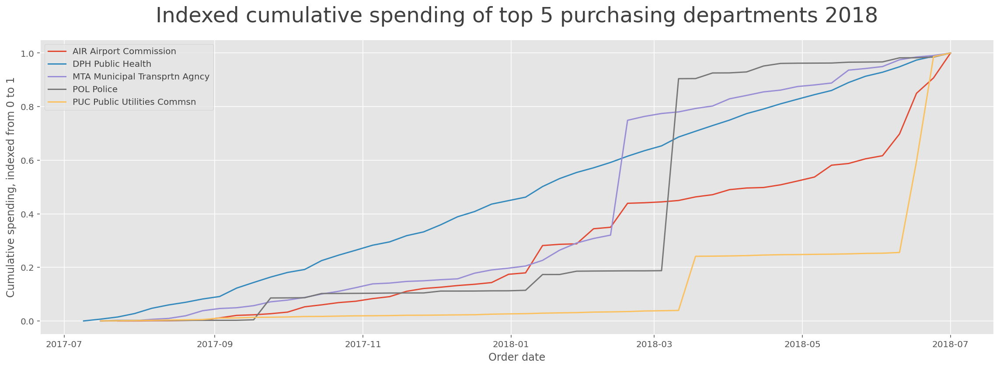

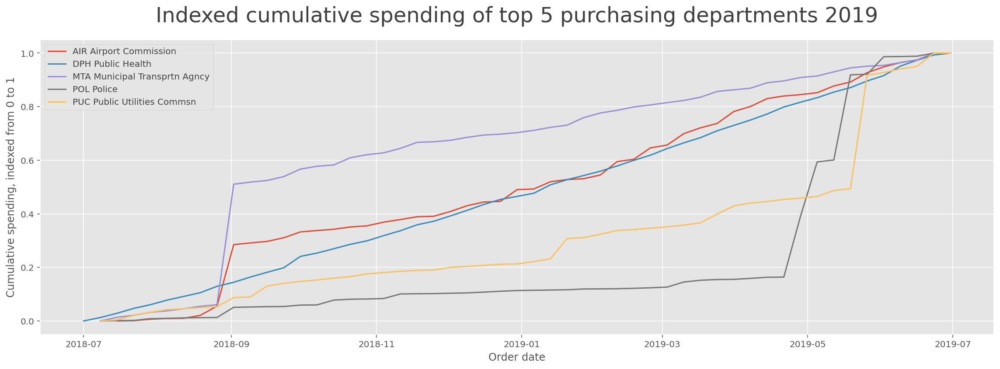

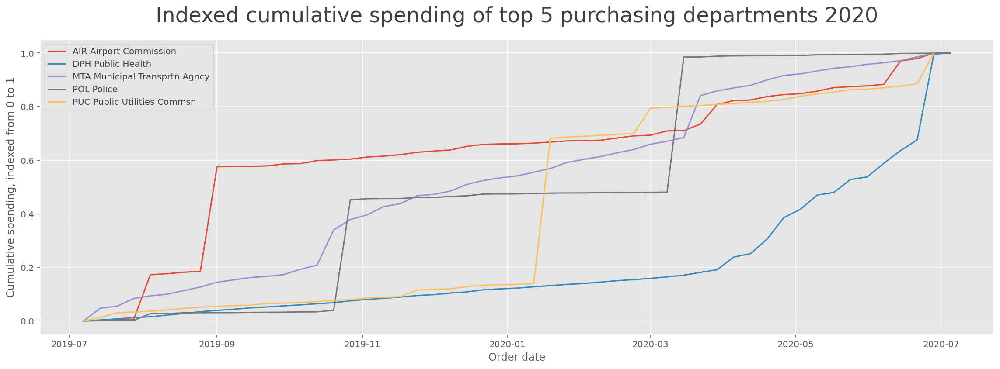

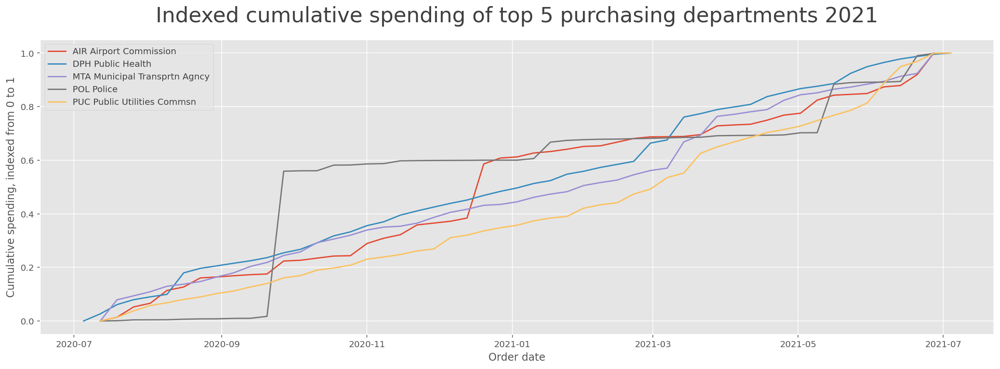

In [32]:
top_n = 5
tmp = df.groupby("dept_title").price.sum().sort_values(ascending=False)[:top_n]
tmp = df[df.dept_title.isin(tmp.index)]

for year in [2018, 2019, 2020, 2021]:
    tops = tmp[tmp.fiscal_year==year]
    g = tops.groupby("dept_title")

    plt.figure(figsize=(16,6))
    for name, top in g:
        top = top.set_index("order_date").resample("W").price.sum()
        top = top.reset_index()
        top["price_cum"] = top.price.cumsum()
        minmax = MinMaxScaler()
        top.price_cum = minmax.fit_transform(top.price_cum.values.reshape(-1, 1))
        sns.lineplot(data=top, x="order_date", y="price_cum", label=name)
    plt.title(f"Indexed cumulative spending of top 5 purchasing departments {year}", size=TITLE_SIZE, pad=TITLE_PADDING)
    plt.xlabel("Order date")
    plt.ylabel("Cumulative spending, indexed from 0 to 1")
    plt.tight_layout()
    plt.show()

### Corona epidemic effects
How did the Corona crisis affect purchases?
- Looking at the purchases of the Dept. of Public Health **we clearly see the massive increase in purchases in 2020, particularly shortly after the outbreak in the 2nd quarter.**

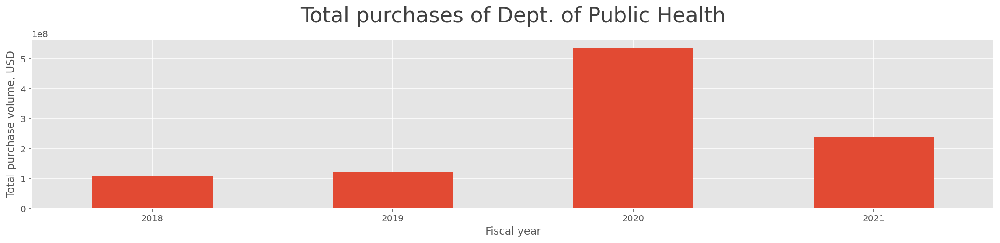

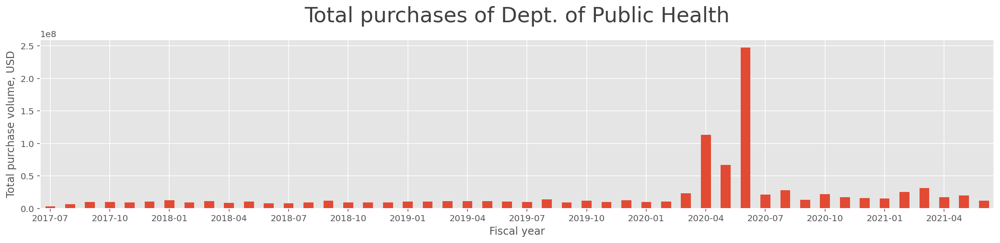

In [33]:
df_dph = df[df.dept_title=="DPH Public Health"].copy()
df_dph.reset_index(drop=True, inplace=True)

plt.figure(figsize=(16,4))
df_dph.groupby("fiscal_year").price.sum().plot.bar()
plt.title(f"Total purchases of Dept. of Public Health", size=TITLE_SIZE, pad=TITLE_PADDING)
plt.xticks(rotation=0)
plt.xlabel("Fiscal year")
plt.ylabel("Total purchase volume, USD")
plt.tight_layout()
plt.show()

plt.figure(figsize=(16,4))
ax = df_dph.set_index("order_date").resample("M").price.sum().plot.bar()
# ax.set_xticks(np.arange(min(ax.get_xticks()), max(ax.get_xticks()), 3));
plt.title(f"Total purchases of Dept. of Public Health", size=TITLE_SIZE, pad=TITLE_PADDING)

ticks = ax.get_xticklabels()
ticks_new = []
for tick in ticks:
    ticks_new.append(tick.get_text().split(" ")[0].split("-")[:2])
ticks_new = ["-".join(x) for x in ticks_new]

plt.xticks(ticks=ax.get_xticks()[::3], labels=ticks_new[::3], rotation=0)
plt.xlabel("Fiscal year")
plt.ylabel("Total purchase volume, USD")
plt.tight_layout()
plt.show()

### Reducing the data to a most relevant subset
- For further analysis and data products we could **reduce the data set even further** and **concentrate on the high leverage orders**. 
- Lessons learned with this subset of data can than possibly be applied to orders with less financial impact if needed.
- A reasonable subset would be to **use the top 20 departments, the top 250 goods and the top 350 suppliers** by total sales volume. 
- This subset of 1.22 Mio. purchases accounts for ~86% of sales volume and ~77% of purchases.

In [34]:
top_n_depts = 20
top_n_commodities = 250
top_n_suppliers = 350

top_depts = df.groupby("dept_title").price.sum().sort_values(ascending=False)[:top_n_depts].index
df_sub = df[df.dept_title.isin(top_depts)].copy()

top_commodities = df_sub.groupby("commodity_code").price.sum().sort_values(ascending=False)[:top_n_commodities].index
df_sub = df_sub[df_sub.commodity_code.isin(top_commodities)].copy()

top_suppliers = df_sub.groupby("supplier_name").price.sum().sort_values(ascending=False)[:top_n_suppliers].index
df_sub = df_sub[df_sub.supplier_name.isin(top_suppliers)].copy()

tmp = df_sub.groupby("commodity_code").order.count()

minimum_order_count = 4
rare = tmp[tmp < minimum_order_count].index
share_perc = 100 - (100 / df_sub.price.sum() * df_sub[df_sub.commodity_code.isin(rare)].price.sum())
share_samples = 100 / len(df_sub) * len(df_sub[df_sub.commodity_code.isin(rare)])
df_sub = df_sub[~df_sub.commodity_code.isin(rare)].copy()

df_sub.reset_index(drop=True, inplace=True)
df_sub.to_csv("df_subset.csv", index=False)

df_sub.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1221923 entries, 0 to 1221922
Data columns (total 11 columns):
 #   Column           Non-Null Count    Dtype         
---  ------           --------------    -----         
 0   fiscal_year      1221923 non-null  int16         
 1   order_date       1221923 non-null  datetime64[ns]
 2   order            1221923 non-null  object        
 3   dept_code        1221923 non-null  object        
 4   dept_title       1221923 non-null  object        
 5   commodity_code   1221923 non-null  int32         
 6   commodity_title  1221923 non-null  object        
 7   supplier_name    1221923 non-null  object        
 8   quantity         1221923 non-null  float64       
 9   price            1221923 non-null  float64       
 10  price_per_unit   1221923 non-null  float64       
dtypes: datetime64[ns](1), float64(3), int16(1), int32(1), object(5)
memory usage: 90.9+ MB


In [35]:
sub_sales = 100 / df.price.sum() * df_sub.price.sum()
sub_samples = 100 / len(df) * len(df_sub)
print(f"Reducing to top {top_n_depts} departments, top {top_n_commodities} goods and top {top_n_suppliers} suppliers accounts for\n\n\t- {sub_sales:.1f}% sales volume and\n\t- {sub_samples:.1f}% of number of purchases\n\nof the orginal data set (2018–2021).")

Reducing to top 20 departments, top 250 goods and top 350 suppliers accounts for

	- 86.4% sales volume and
	- 77.0% of number of purchases

of the orginal data set (2018–2021).


# Conclusions from analysis
---

- **The distributions of purchases are very skewed. Only few departments, goods and suppliers account for a mayor share of the total budget.** 
- The data set can be reduced in a sensible way **to concentrate on areas of high leverage.**
- **We found several time related patterns, that can be detrimental to the efficient use of budget.** A more thorough analysis and more awareness for the patterns could bring substantial financial benefit.
- **Price analysis and modeling does not make sense unless we get more granular data.** The commodity categories are still way to broad to come to robust conclusions. 
- **Outlieranalysis and anomaly detection can be sensible machine learning methods for next steps.**
